<div dir="rtl">
  :تمرین 3
</div>    

<div dir="rtl">
    
## رگرسیون لجیستیک
    
</div>    

<div dir="rtl">
    ابتدا  دو کتابخانه مفید پایتون را وارد می کنیم که بصورت زیر استفاده خواهیم کرد.
    <br>
    - اولین کتابخانه `numpy` برای کار با آرایه های N بعدی است.
    <br>
    - - کتابخانه دوم `matplotlib` برای رسم شکل است.
</div>    

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from utils import *

# setup for printing numpy arrays
np.set_printoptions(precision=2)

In [2]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 120

<div dir="rtl">
    
 ## بخش اول: رگرسیون لجیستیک
 
</div>    

<div dir="rtl">
    در قسمت اول این تمرین ، ما یک مدل رگرسیون لجستیک برای پیش بینی پذیرش دانشجو در دانشگاه ایجاد خواهیم کرد.
</div>   

<div dir="rtl">
    فرض کنید شما مدیر گروه کامپیوتر دانشگاه هستید و می خواهید شانس پذیرش هر متقاضی را براساس نتایج آنها در دو آزمون تعیین کنید.شما داده های سوابق متقاضیان قبلی را دارید که می توانید از آنها به عنوان مجموعه آموزشی برای رگرسیون لجستیک استفاده کنید. برای هر نمونه آموزش ، شما نمرات متقاضی در دو آزمون و تصمیم پذیرش را دارید. 
</div>   

<div dir="rtl">
    
   ### داده ها 
    
</div>   

<div dir="rtl">
    داده هایی که برای این قسمت از تکالیف نیاز دارید در فایل متنی 'data/dataset1.txt' به شما داده می شود. در اینجا ، می توانید 10 ردیف اول را از این فایل مشاهده کنید.دو ستون اول یا **ویژگی های ورودی** امتیاز متقاضی در دو آزمون مختلف است و ستون سوم (یا **خروجی هدف**) تصمیم پذیرش است. در اینجا ، "0" به معنی "پذیرفته نشده" و "1" به معنی "پذیرفته شده" است. 
</div>   

```python
34.62365962451697,78.02469281536240,0
30.28671076822607,43.89499752400101,0
35.84740876993872,72.90219802708364,0
60.18259938620976,86.30855209546826,1
79.03273605071010,75.34437643691030,1
45.08327747668339,56.31637178153050,0
61.10666453684766,96.51142588489624,1
75.02474556738889,46.55401354116538,1
76.09878670226257,87.42056971926803,1
84.43281996120035,43.53339331072109,1
``` 

<div dir="rtl">
    اکنون ، هدف، ساختن یک مدل طبقه بندی است که احتمال پذیرش را بر اساس نمرات آزمون تخمین بزند.
</div>   

<div dir="rtl">
    
   ### بارگذاری داده ها
    
</div>   

<div dir="rtl">
    تابع "load_data ()" قبلاً تنظیم شده است تا این داده ها را برای شما بارگذاری کند.نام پوشه ای را که حاوی داده ها است (در این مورد `data/dataset1.txt`) بازیابی می کند و« X »و« y »را برمی گرداند. این تابع در پوشه `utils.py` برای شما پیاده سازی شده است و در ابتدای این نوت بوک با استفاده از عبارت import وارد می شود. 
</div>   

```python
    from utils import *
```

<div dir="rtl">
    لطفاً مراحل اجرا را ببینید و مطمئن شوید که همه جزئیات را درک کرده اید.
</div>   

In [3]:
X, y = load_data(fname='data/dataset1.txt', include_bias=True)

print(X.shape)
print(y.shape)

(100, 3)
(100,)


<div dir="rtl">
    لطفا توجه داشته باشید که برخلاف تکلیف قبلی ، در اینجا در این تمرین `y یک بردار 1d است.
</div>   

<div dir="rtl">
    
   ### رسم داده ها
    
</div>   

<div dir="rtl">
    قبل از شروع هر کاری ، معمولاً درک داده ها با تجسم آنها مفید است. برای این مجموعه داده ، می توانید از یک نمودار پراکندگی برای تجسم داده ها استفاده کنید ، زیرا فقط دو ویژگی برای ترسیم دارد ("سود" و "جمعیت"). (بسیاری از مشکلات دیگری که در زندگی واقعی با آنها روبرو خواهید شد چند بعدی هستند و نمی توان آنها را در یک طرح 2 بعدی ترسیم کرد.)
</div>   

<div dir="rtl">
    اکنون ، برای ایجاد نمودار پراکندگی داده ها ، می توانید  "plot_data"را صدا بزنید. باز هم ،  این تابع را برای شما پیاده سازی کرده و در ابتدای این فایل  وارد کرده ایم. سلول زیر را برای دیدن داده ها اجرا کنید.
</div>   

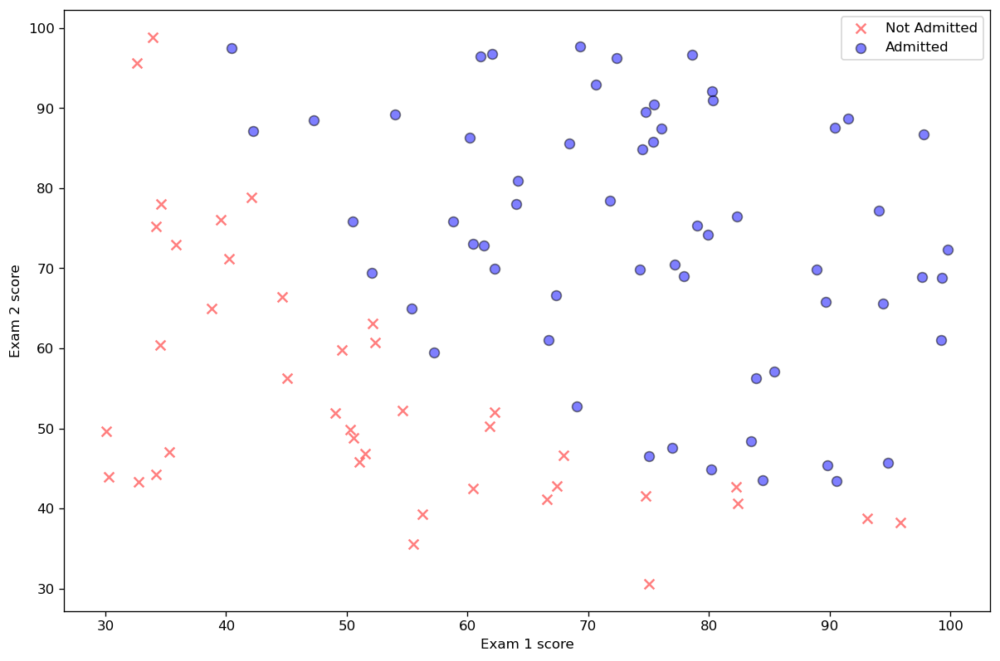

In [4]:
plot_data(X, y, labels=['Not Admitted', 'Admitted'])

<div dir="rtl">
    
   ### تابع سیگموئید
    
</div>   

<div dir="rtl">
    قبل از شروع با تابع هزینه واقعی ، به یاد داشته باشید که فرضیه رگرسیون لجستیک به صورت زیر تعریف شده است:
</div>   

$$h_\theta(x)=g(\theta^T x)$$

<div dir="rtl">
    که در آن تابع g تابع سیگموئید است. تابع سیگموئید به صورت زیر تعریف می شود
</div>   

$$g(z)=\frac{1}{1 + e^{-z}}$$

<div dir="rtl">
    اولین قدم شما پیاده سازی این تایع است تا بتواند توسط بقیه برنامه شما فراخوانی شود.پس از پایان کار ، با فراخوانی `sigmoid (x)` چند مقدار را امتحان کنید. برای مقادیر مثبت بزرگ `x` ، سیگموئید باید نزدیک به` 1` باشد ، در حالی که برای مقادیر منفی بزرگ ، سیگموئید باید نزدیک به `0` باشد. ارزیابی `sigmoid (0)` باید دقیقاً `0.5` به شما بدهد.
    <br>
    توجه داشته باشید که کد شما باید با بردارها و ماتریس ها نیز کار کند. برای یک ماتریس ، تابع شما باید تابع سیگموئید را روی هر عنصر انجام دهد.
</div>   

In [5]:
def sigmoid(x):
    g = np.size(x)
    g = 1 / (1+np.exp(-x))
    return g

<div dir="rtl">
    اکنون ، می توانید سلول های زیر را اجرا کنید تا ببینید آیا تابع سیگموئید شما درست است.
</div>   

In [6]:
# testing sigmoid for scaler values
import math
print("sigmoid(   0) = %.2f" % sigmoid(0))
print("sigmoid( 100) = %.2f" % sigmoid(100))
print("sigmoid(-100) = %.2f" % sigmoid(-100))

sigmoid(   0) = 0.50
sigmoid( 100) = 1.00
sigmoid(-100) = 0.00


<div dir="rtl">
    بیایید یک بررسی عقلانی سریع انجام دهیم تا مطمئن شویم که اجرای تابع سیگموئید درست است.
</div>   

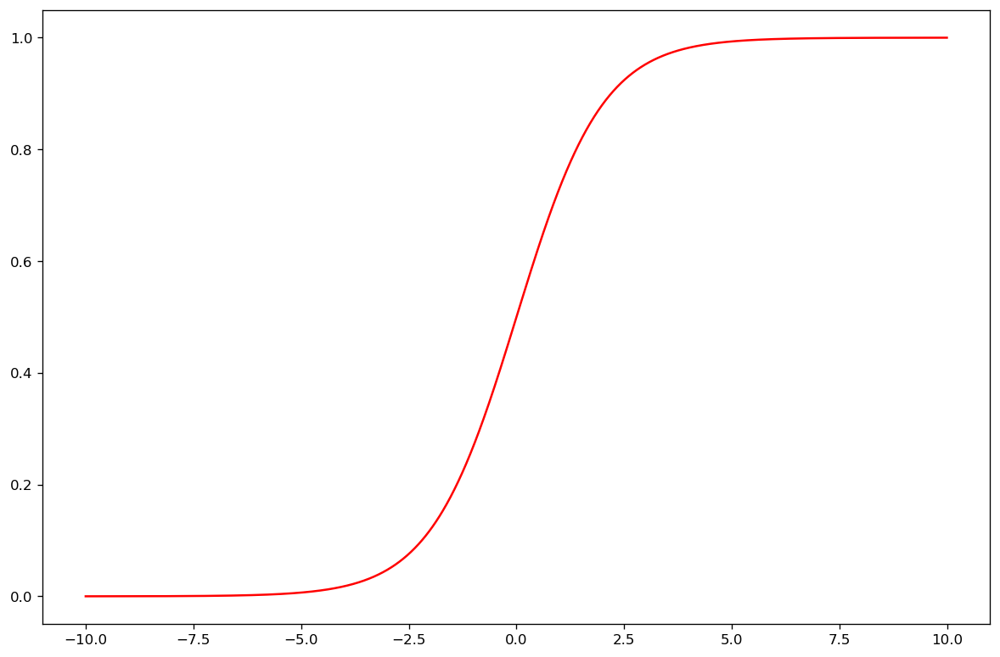

In [7]:
x = np.arange(-10, 10, 0.01)
plt.plot(x,sigmoid(x),'r')
plt.show()

<div dir="rtl">
    
   ### تابع هزینه و گرادیان (مشتق ها)
    
</div>   

<div dir="rtl">
    اکنون شما تابع هزینه و مشتق را برای رگرسیون لجستیک پیاده سازی خواهید کرد.کد را در `logistic_regression_cost ()` تکمیل کنید تا هزینه را برگردانید و` grads ()` را برای برگرداندن مشتق تابع هزینه.
</div>   

<div dir="rtl">
    به یاد بیاورید که تابع هزینه در رگرسیون لجستیک برابر است
</div>   

$$J(\theta) = \frac{1}{m} \sum_{i=1}^{m} [-y^{(i)} \log(h_\theta(x^{(i)})) - (1 - y^{(i)}) \log(1 - h_\theta(x^{(i)}))]$$

<div dir="rtl">
    و مشتق هزینه یک بردار θ است که عنصر j (برای j = 0،1 ، ... ، n) به شرح زیر تعریف شده است:
</div>   

$$\frac{\partial J(\theta)}{\partial \theta_j} = \frac{1}{m} \sum_{i=1}^{m} (h_\theta(x^{(i)}) - y^{(i)})x^{(i)}_{j}$$

<div dir="rtl">
    توجه داشته باشید که گرچه این مشتق با مشتق رگرسیون خطی یکسان به نظر می رسد ، اما فرمول در واقع متفاوت است زیرا رگرسیون خطی و لجستیکی تعاریف مختلفی از تابع فرضیه $h_\theta(x)$ دارند

</div>   

In [8]:
def logistic_regression_cost(theta, X, y):
    m=len(X)
    J = (-1/m) * np.sum(np.multiply(y, np.log(sigmoid(X @ theta))) 
        + np.multiply((1-y), np.log(1 - sigmoid(X @ theta))))
    return J
def grads(theta, X, y):
    m=len(X)
    return ((1/m) * X.T @ (sigmoid(X @ theta) - y))

<div dir="rtl">
    برای بررسی پیاده سازی تابع خود ، سلول زیر را اجرا کنید. اگر تابع هزینه را به درستی پیاده سازی کرده اید ، باید ببینید که این هزینه در حدود "0.693" و بردار گرادیان در حدود "[-0.1 ، -12.01 ، -11.26]" است.
</div>   

In [9]:
# testing cost function and gradient
theta = np.zeros((3,))
print("cost = %.3f" % logistic_regression_cost(theta, X, y))
print("gradient = %s" % grads(theta, X, y).ravel())

cost = 0.693
gradient = [ -0.1  -12.01 -11.26]


<div dir="rtl">
    
   ###   یادگیری پارامترها با استفاده از `scipy.optimize.minimize` 
    
</div>   

<div dir="rtl">
    در تمرین قبلی ، با اجرای گرادیان کاهشی ، پارامترهای بهینه مدل رگرسیون خطی را پیدا کردید. شما یک تابع هزینه نوشتید و مشتق آن را محاسبه کردید ، و بر این اساس یک گام از گرادیان کاهشی را برداشتید.این بار ، به جای برداشتن گامهای گرادیان کاهشی ، از تابعی در `scipy.optimize` libray به نام` minimize` استفاده خواهید کرد.
</div>   

<div dir="rtl">
    بیایید ابتدا این تابع را وارد کنیم تا بعداً از آن استفاده کنیم.
</div>   

In [10]:
from scipy.optimize import minimize

<div dir="rtl">
    `scipy.optimize.minimize` یک الگوریتم بهینه سازی است که کمینه یک تابع را پیدا می کند. برای رگرسیون لجستیک ، می خواهید تابع هزینه `J (θ)` را با پارامترهای `θ` بهینه کنید.
</div>   

<div dir="rtl">
    به طور مشخص ، شما می خواهید از "minimize" برای یافتن بهترین پارامترهای `θ` برای تابع هزینه رگرسیون لجستیک ، با توجه به یک مجموعه داده ثابت (با مقادیر` X` و `y) استفاده کنید.شما برای مینیمم را برای ورودی های زیر بدست خواهید آورد: 
</div>   

<div dir="rtl">
    مقادیر اولیه: مقادیر اولیه پارامترهایی که سعی در بهینه سازی آنها داریم.
    <br>
    تابع هزینه:تابعی که اگر به مجموعه آموزش و یک «θ» خاص داده شود ، هزینه رگرسیون لجستیک برای مجموعه داده (`X` ،` y) محاسبه می شود. 
    <br>
    مشتق ها : یک تابع ، هنگامی که به مجموعه آموزشی و "θ" خاص داده می شود ، مشتق را با توجه به "θ" برای مجموعه داده محاسبه می کند ("X" ، "y").
</div>   

```python
minimize(cost_function, x0=theta0, args=(X, y), method='CG', jac=grads)
```

In [11]:
result = minimize(logistic_regression_cost, x0=np.zeros((3,)), args=(X, y), method='bfgs', jac=grads)

In [12]:
result

      fun: 0.20349770158944377
 hess_inv: array([[ 3.31e+03, -2.64e+01, -2.70e+01],
       [-2.64e+01,  2.24e-01,  2.03e-01],
       [-2.70e+01,  2.03e-01,  2.35e-01]])
      jac: array([-9.52e-09, -9.32e-07, -2.83e-07])
  message: 'Optimization terminated successfully.'
     nfev: 31
      nit: 23
     njev: 31
   status: 0
  success: True
        x: array([-25.16,   0.21,   0.2 ])

In [13]:
theta_opt = result.x  # optimal theta
print(theta_opt)

[-25.16   0.21   0.2 ]


<div dir="rtl">
    اکنون ، با استفاده از پارامترهای بهینه θ ، تابع هزینه شما را فراخوانی خواهیم کرد. باید ببینید که هزینه تقریباً "0.203" است.
</div>   

In [14]:
cost = logistic_regression_cost(theta_opt, X, y)
print("cost = {:.3f}".format(cost))

cost = 0.203


<div dir="rtl">
    سپس از این مقدار نهایی `θ` برای ترسیم مرز تصمیم گیری در داده های آموزش استفاده می شود و در نتیجه رقمی مشابه شکل زیر حاصل می شود. همچنین به شما پیشنهاد میکنم که کد plot_decision_boundary()  که مرزها را با استفاده از تتا بدست آمده و در فایل `utils.py` موجود است را بررسی کنید.   
</div>   

<div dir="rtl">
    گر همه چیز خوب است ، باید چیزی مانند  زیر را ببینید:
</div>   

<img src='imgs/part_1_log_reg_decision_boundary.png' width='75%'>

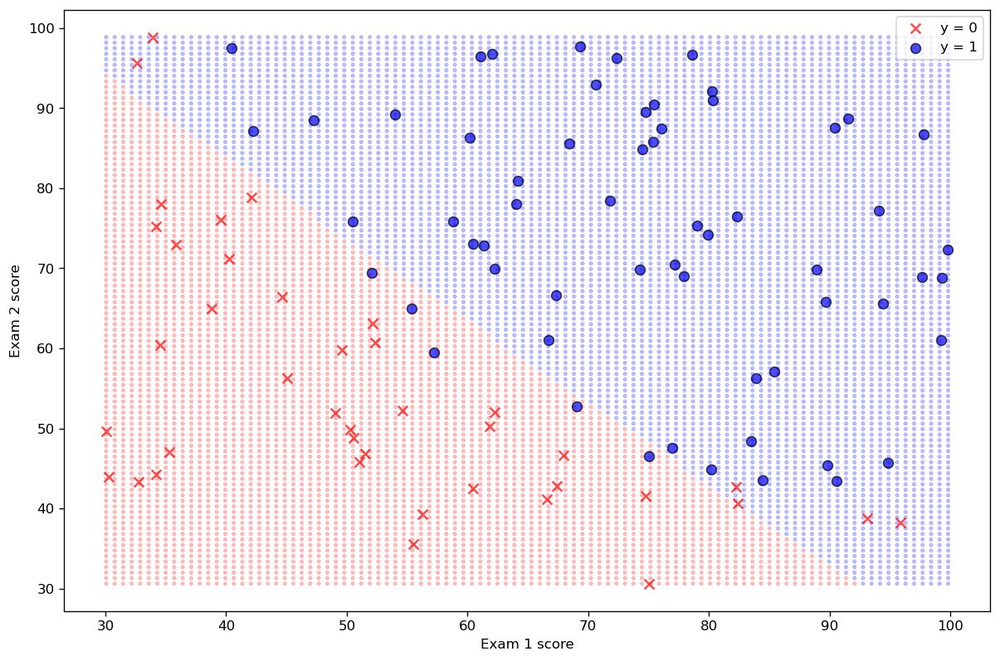

In [15]:
plot_decision_boundary(theta_opt, X, y)

<div dir="rtl">
    
   ### ارزیابی الگوریتم دسته بندی 
    
</div>   

<div dir="rtl">
       پس از یادگیری پارامترها ، می توانید با استفاده از این مدل پیش بینی کنید که آیا دانشجوی خاصی پذیرفته می شود یا خیر. برای دانشجویی با نمره 45 برای آزمون اول  و نمره 85 برای آزمون 2  ، باید انتظار پذیرش 0.776 را داشته باشید.
    <br>
    روش دیگر برای ارزیابی کیفیت پارامترهایی که پیدا کرده ایم این است که ببینیم مدل آموخته شده چقدر در مجموعه آموزش ما پیش بینی می کند. در این قسمت ، وظیفه شما تکمیل کد در predict () است. تابع پیش بینی با توجه به مجموعه داده ها و بردار پارامتر یاد گرفته `θ` پیش بینی های` 1` یا `0` را تولید می کند.
</div>   

In [16]:
def predict(theta, X):
    a=[]
    probability = sigmoid(X@theta)
    for x in probability:
        if x>=0.5:
            a.append(1)
        else:
            a.append(0)
    return a

In [17]:
x_test = np.array([[1, 45, 85]])
print(sigmoid(x_test @ theta_opt.T))
print(predict(theta_opt, x_test))

[0.78]
[1]


<div dir="rtl">
    
   ## بخش 2: رگرسیون لجیستیک تنطیم شده 
    
</div>   

<div dir="rtl">
    در این قسمت از تمرین ، شما رگرسیون لجستیکی تنطیم شده را برای پیش بینی اینکه ریز تراشه های  تولید شده  در یک کارخانه درآزمون تضمین کیفیت (QA) تایید می شوند ، اجرا خواهید کرد. در طی QA ، هر میکروچیپ آزمایش های مختلفی را برای اطمینان از عملکرد صحیح انجام می دهد.
</div>   

<div dir="rtl">
    فرض کنید شما مدیر محصول کارخانه هستید و در چند آزمون مختلف نتایج آزمایش برخی از ریز تراشه ها را دارید. از این دو آزمون می خواهید تعیین کنید که آیا میکرو تراشه ها باید پذیرفته شوند یا رد شوند. برای کمک به تصمیم گیری شما مجموعه داده ای از نتایج آزمون را در ریز تراشه های گذشته دارید که می توانید از آن مدل رگرسیون لجستیک بسازید.
</div>   

<div dir="rtl">
    
   ### رسم داده ها 
    
</div>   

<div dir="rtl">
    مشابه قسمت قبلی این تمرین ، "plot_data ()" برای تولید شکل مانند شکل زیر استفاده می شود که در آن محورها دو نمره آزمون هستند و مثبت (y = 1 ، پذیرفته شده) و منفی (y = 0 ، رد شده) نمونه ها با نشانگرهای مختلف نشان داده می شوند.
</div>   

In [18]:
X, y = load_data(fname='data/dataset2.txt')

print(X.shape)
print(y.shape)

(118, 3)
(118,)


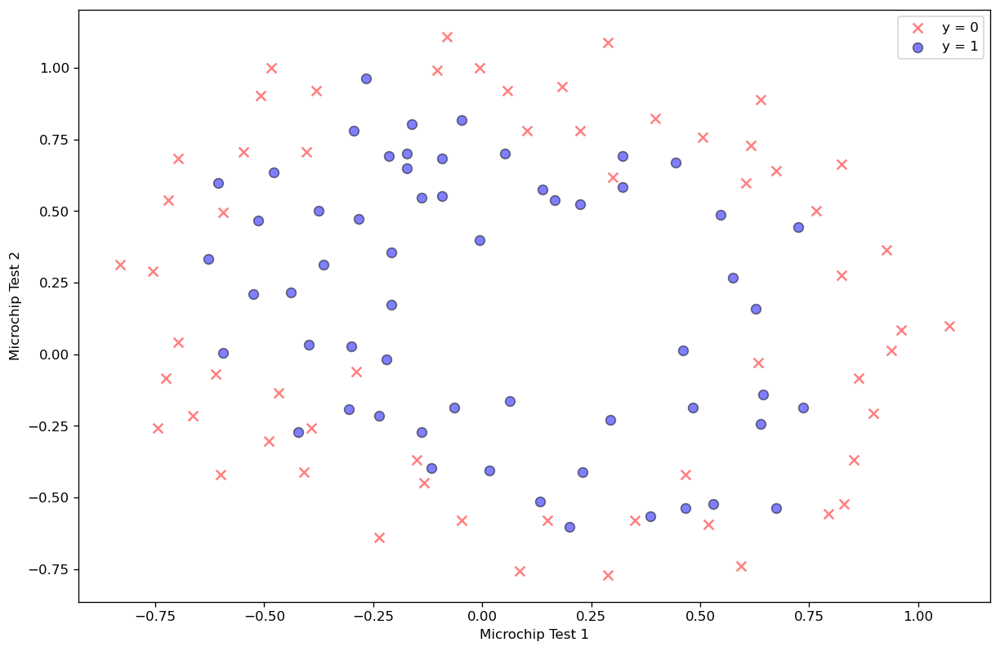

In [19]:
plt.figure(figsize=(12, 8), dpi=120)
plot_data(X, y, xlabel='Microchip Test 1', ylabel='Microchip Test 2')

<div dir="rtl">
    این داده ها نسبت به مثال قبلی کمی پیچیده تر به نظر می رسند. به طور خاص ، متوجه خواهید شد که هیچ مرز تصمیم گیری خطی وجود ندارد که عملکرد خوبی در این داده ها داشته باشد. یکی از راه های مقابله با این روش با استفاده از یک تکنیک خطی مانند رگرسیون لجستیک ، ساخت ویژگی هایی است که از چند جمله ای ویژگی های اصلی گرفته شده است.
<br>
بیایید با ایجاد یک دسته از ویژگی های چند جمله ای با استفاده از تابع `map_features ()` که برای شما در` utils.py` پیاده سازی کرده ایم ، شروع کنیم.
</div>   

In [20]:
degree = 8
X_poly = map_features(X[:, 1], X[:, 2], degree=degree)
print(X_poly.shape)

(118, 45)


<div dir="rtl">
    اکنون ما باید هزینه و توابع گرادیان را از قسمت 1 اصلاح کنیم تا بخش تنظیم را در آن بگنجانیم. لطفاً پیاده سازی دو تابع زیر را کامل کنید.
</div>   

In [21]:
def regularized_logistic_regression_cost(theta, X, y, reg, return_grad=False):
    m=len(X)
    J1 = (-1/m) * np.sum(np.multiply(y, np.log(sigmoid(X @ theta))) 
        + np.multiply((1-y), np.log(1 - sigmoid(X @ theta))))
    reg = ( float(reg) / (2*m)) * np.power(theta[1:theta.shape[0]],2).sum()
    J = J1 + reg
    return J

def regularized_grads(theta, X, y, reg):
    m = len(X)
    grad = np.zeros([m,1])
    grad = (1/m) * X.T @ (sigmoid(X @ theta) - y)
    grad[1:] = grad[1:] + (reg / m) * theta[1:]
    return grad

<div dir="rtl">
    اگر این دو تابع را به درستی پیاده سازی کرده اید ، باید ببینید که برای $ \ theta $ برابر با صفر است ، هزینه تقریباً "0.693" است.
</div>   

In [22]:
theta = np.zeros(X_poly.shape[1])
cost = regularized_logistic_regression_cost(theta, X_poly, y, 1.0)
print('cost = {:.3f}'.format(cost))

cost = 0.693


<div dir="rtl">
    اکنون می توانیم از همان تابع بهینه سازی قسمت 1 برای محاسبه راه حل بهینه استفاده کنیم.
</div>   

In [23]:
reg = 0.0
result = minimize(
    regularized_logistic_regression_cost, 
    x0=theta, 
    args=(X_poly, y.ravel(), reg), 
    method='bfgs', 
    jac=regularized_grads)

In [24]:
result.x

array([   21.59,    47.23,    42.93,  -160.44,   -66.7 ,   -45.35,
        -255.28,   -93.4 ,  -502.71,  -205.31,   338.74,   620.04,
         555.9 ,   109.53,   -71.9 ,   129.75,  -313.67,  1978.7 ,
         546.71,  1185.08,   313.38,   344.39, -1781.95,  -773.41,
          49.69,  -605.86,  -752.52,   116.46,   564.45,   880.52,
        -669.13,   623.48, -2492.82,   391.87,   506.11,   242.69,
       -1413.11,  1181.44,  -238.88, -1783.01, -1436.85,   250.12,
       -1040.44,  -722.57,  -436.73])

<div dir="rtl">
    سرانجام ، ما می توانیم از تابع پیش بینی قسمت 1 استفاده کنیم تا ببینیم راه حل ما چقدر دقیق روی داده های آموزش است. پس از اجرای سلول زیر ، باید ببینید که دقت "88.14٪" است.
</div>   

In [25]:
def accuracy(y_pred, y_true):
    return 100. * np.sum(y_pred == y_true) / len(y_true)

In [26]:
theta_opt = result.x
predictions = predict(theta_opt, X_poly)
acc = accuracy(predictions, y)
print('accuracy = {:.2f}%'.format(acc))

accuracy = 91.53%


<div dir="rtl">
    سلول زیر را اجرا کنید تا نتیجه دسته بندی را ببینید. اگر همه چیز خوب است ، باید چیزی شبیه به این را ببینید:
</div>   

<img src='imgs/part_2_lambda_0.png' width='75%'>

<div dir="rtl">
    با یک λ کوچک ، باید متوجه شوید که دسته بند تقریباً هر نمونه آموزشی را بدرستی تشخیص می دهد ، اما مرز بسیار پیچیده ای ترسیم می کند ، بنابراین داده ها بیش برازش شده اند.
</div>   

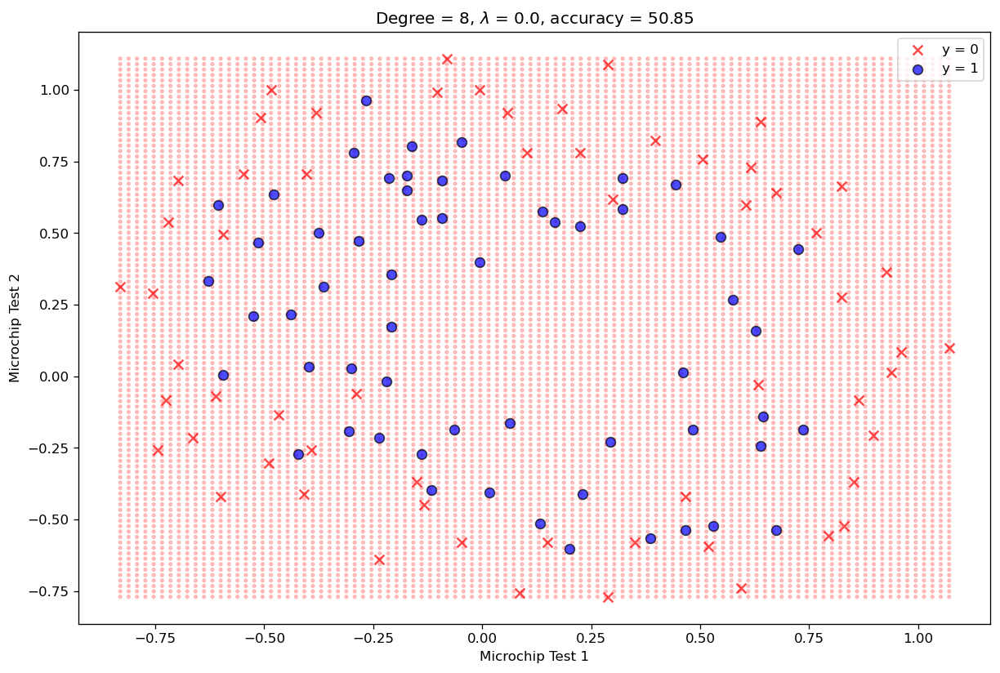

In [27]:
title = "Degree = {}, $\lambda$ = {}, accuracy = {:.2f}".format(degree, reg, acc)
plot_decision_boundary(theta_opt, X_poly, y.ravel(), 
                       xlabel='Microchip Test 1', ylabel='Microchip Test 2', 
                       degree=degree, title=title)

<div dir="rtl">
    اکنون با امتحان مقدار متفاوت برای degree و reg ، (قدرت تنظیم) ، یک مرز تصمیم دقیق و هموار برای داده های داده شده پیدا کنید.
</div>   

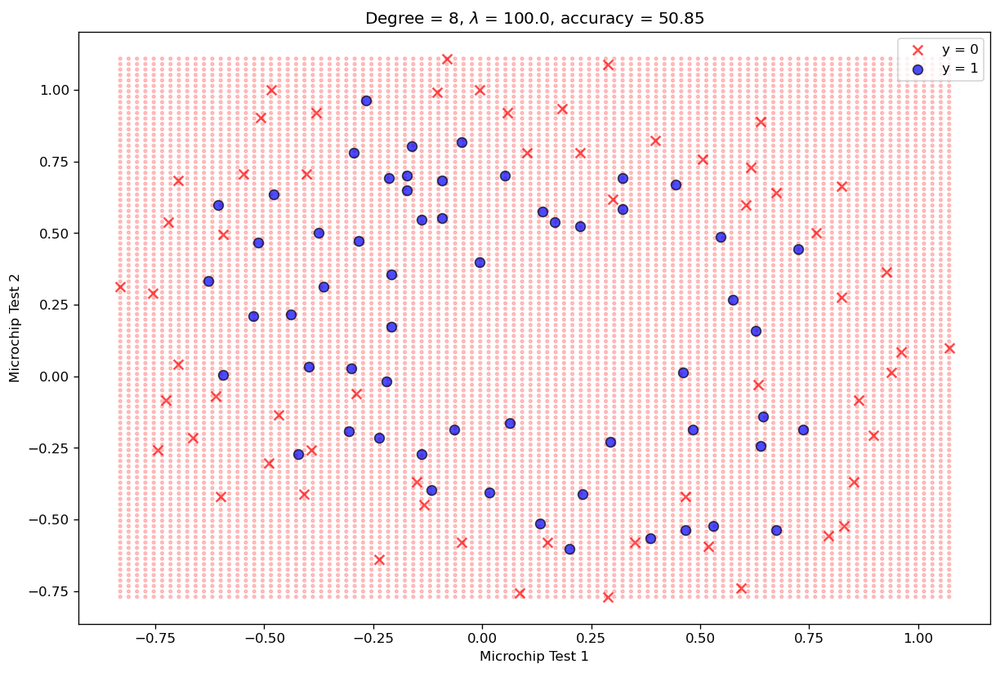

In [28]:
# change the value of these two hyper-parameters
degree = 8
reg = 100.0

# create polynomial features
X_poly = map_features(X[:, 1], X[:, 2], degree=degree)

# initialize theta to 0
theta = np.zeros(X_poly.shape[1])

# optimize cost function to find the optimal parameters
result = minimize(
    regularized_logistic_regression_cost, 
    x0=theta, 
    args=(X_poly, y.ravel(), reg), 
    method='bfgs', 
    jac=regularized_grads)

# compute accuracy
theta_opt = result.x
predictions = predict(theta_opt, X_poly)
acc = accuracy(predictions, y)

# plot decision boundary
title = "Degree = {}, $\lambda$ = {}, accuracy = {:.2f}".format(degree, reg, acc)
plot_decision_boundary(theta_opt, X_poly, y.ravel(), 
                       xlabel='Microchip Test 1', ylabel='Microchip Test 2',
                       degree=degree, title=title)

<div dir="rtl">
    

## استفاده از کتابخانه Scikit-learn 

</div>  

<div dir="rtl">
    اگرچه ما این الگوریتم ها را از ابتدا پیاده سازی کردیم ، لازم به ذکر است که برای حل این مشکل می توانیم از کتابخانه پایتون سطح بالا مانند scikit-learn نیز استفاده کنیم.
</div>   

In [157]:
from sklearn import linear_model
C = 1e10
model = linear_model.LogisticRegression(penalty='l2', C=C, fit_intercept=False)
model.fit(X_poly, y.ravel());

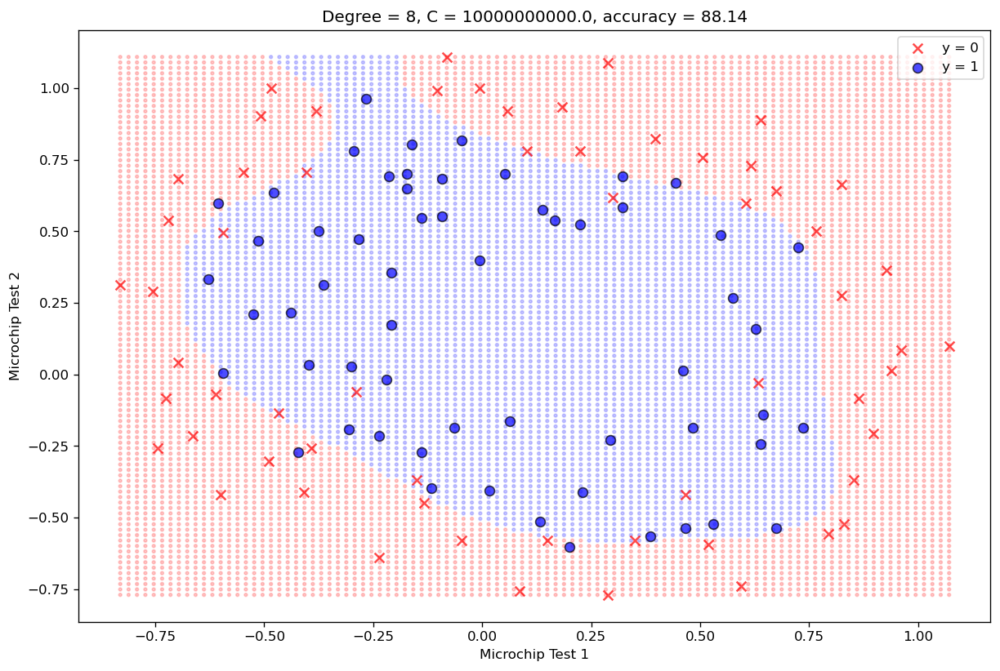

In [158]:
acc = model.score(X_poly, y) * 100

theta_opt = np.array(model.coef_)

title = "Degree = {}, C = {}, accuracy = {:.2f}".format(degree, C, acc)
plot_decision_boundary(theta_opt, X_poly, y.ravel(), 
                       xlabel='Microchip Test 1', ylabel='Microchip Test 2',
                       degree=degree, title=title)

<div dir = "rtl">
    
   ## ارسال تمرین
</div>  